In [1]:
import json
import torch
# pip install git+https://github.com/huggingface/transformers
from transformers import Blip2Processor, Blip2ForConditionalGeneration
from PIL import Image


from lavis.models import load_model_and_preprocess

/home/md703/scs/ntu-cvpdl/hw3/src/blip/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/md703/scs/ntu-cvpdl/hw3/src/blip/.venv/lib/python3.9/site-packages/fairscale/experimental/nn/offload.py:19: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  return torch.cuda.amp.custom_fwd(orig_func)  # type: ignore
/home/md703/scs/ntu-cvpdl/hw3/src/blip/.venv/lib/python3.9/site-packages/fairscale/experimental/nn/offload.py:30: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  return torch.cuda.amp.custom_bwd(orig_func)  # type: ignore


#### Load an example image

In [3]:
with open("../label.json", "r") as f:
    example_data = json.load(f)[0]
    example_labels = example_data['labels']
    example_height = example_data['height']
    example_width = example_data['width']
print(example_data)

{'image': 'construction-site-build-construction-work-159306.jpeg', 'labels': ['Head', 'Face', 'Ear', 'Ear', 'Hands', 'Gloves', 'Gloves', 'Head', 'Safety-vest', 'Shoes', 'Shoes', 'Shoes', 'Shoes', 'Helmet', 'Helmet', 'Safety-suit', 'Person', 'Person'], 'height': 512, 'width': 512, 'bboxes': [[325.889024, 182.33344, 345.44435200000004, 215.16697599999998], [328.0002559999999, 199.8336, 338.2223359999999, 211.50003199999998], [230.00012800000002, 233.99987199999998, 233.555456, 240.999936], [333.44460799999996, 203.83334399999995, 336.3333119999999, 210.833408], [325.555456, 287.16672, 332.22220799999997, 296.0002559999999], [208.889088, 274.49984, 217.33350399999998, 286.66649599999994], [228.111104, 244.99967999999996, 233.2224, 254.166528], [227.33311999999998, 213.50015999999997, 243.99974399999996, 243.00006399999998], [232.11110399999995, 236.33331199999998, 268.44467199999997, 307.499776], [244.33331199999998, 358.666752, 258.000128, 378.66649599999994], [255.88889599999996, 385.00

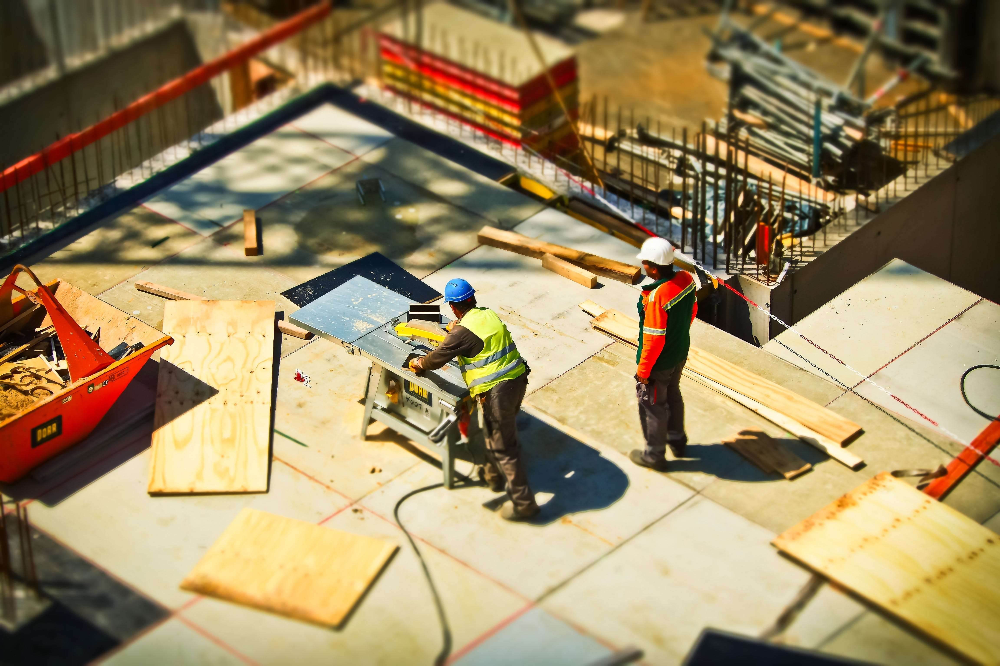

In [7]:
# raw_image = Image.open("../docs/_static/merlion.png").convert("RGB")
raw_image = Image.open(f"../../ref_dataset/images/{example_data['image']}").convert("RGB")
display(raw_image)

In [8]:
# setup device to use
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


#### Load BLIP large captioning model finetuned on COCO

In [9]:
# processors = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", torch_dtype=torch.float16)
# model.to(device)

# processors = Blip2Processor.from_pretrained("Salesforce/blip2-opt-6.7b-coco")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-6.7b-coco", torch_dtype=torch.float16)
# model.to(device)

# processors = Blip2Processor.from_pretrained("Salesforce/blip2-opt-6.7b")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-6.7b", torch_dtype=torch.float16)
# model.to(device)

processors = Blip2Processor.from_pretrained("Salesforce/blip2-flan-t5-xl")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-flan-t5-xl", torch_dtype=torch.float16)
model.to(device)




oading checkpoint shards: 100%|███████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.02s/it]

Blip2ForConditionalGeneration(
  (vision_model): Blip2VisionModel(
    (embeddings): Blip2VisionEmbeddings(
      (patch_embedding): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (encoder): Blip2Encoder(
      (layers): ModuleList(
        (0-38): 39 x Blip2EncoderLayer(
          (self_attn): Blip2Attention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=1408, out_features=4224, bias=True)
            (projection): Linear(in_features=1408, out_features=1408, bias=True)
          )
          (layer_norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
          (mlp): Blip2MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1408, out_features=6144, bias=True)
            (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (layer_norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((

#### generate caption using beam search

In [10]:
inputs = processors(images=raw_image, return_tensors="pt").to(device, torch.float16)

generated_ids = model.generate(**inputs)
generated_text = processors.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
print(generated_text)


two construction workers are working on a construction site


#### generate multiple captions using nucleus sampling and make prompts

In [11]:
# due to the non-determinstic nature of necleus sampling, you may get different captions.
processors.batch_decode(generated_ids, skip_special_tokens=True)[0].strip() + ". "

'two construction workers are working on a construction site. '

In [12]:
example_labels_to_string = ", ".join(example_labels)
example_height_to_string = ", height: " + str(example_height) 
example_width_to_string = ", width: " + str(example_width) 
print(example_labels_to_string + example_height_to_string + example_width_to_string + ", HD quality, highly detailed" )

Head, Face, Ear, Ear, Hands, Gloves, Gloves, Head, Safety-vest, Shoes, Shoes, Shoes, Shoes, Helmet, Helmet, Safety-suit, Person, Person, height: 512, width: 512, HD quality, highly detailed


In [13]:
generated_text = processors.batch_decode(generated_ids, skip_special_tokens=True)[0].strip() + ". "
prompt_w_label = generated_text + example_labels_to_string + example_height_to_string + example_width_to_string
prompt_w_suffix = generated_text + example_labels_to_string + example_height_to_string + example_width_to_string + ", HD quality, highly detailed"
print(generated_text)
print(prompt_w_label)
print(prompt_w_suffix)

two construction workers are working on a construction site. 
two construction workers are working on a construction site. Head, Face, Ear, Ear, Hands, Gloves, Gloves, Head, Safety-vest, Shoes, Shoes, Shoes, Shoes, Helmet, Helmet, Safety-suit, Person, Person, height: 512, width: 512
two construction workers are working on a construction site. Head, Face, Ear, Ear, Hands, Gloves, Gloves, Head, Safety-vest, Shoes, Shoes, Shoes, Shoes, Helmet, Helmet, Safety-suit, Person, Person, height: 512, width: 512, HD quality, highly detailed


#### Fill prompt one by one

In [15]:
# setup device to use
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(device)

# # we associate a model with its preprocessors to make it easier for inference.
# processors = Blip2Processor.from_pretrained("Salesforce/blip2-opt-6.7b-coco")
# model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-6.7b-coco", torch_dtype=torch.float16)
# model.to(device)
# uncomment to use base model
# model, vis_processors, _ = load_model_and_preprocess(
#     name="blip_caption", model_type="base_coco", is_eval=True, device=device
# )

with open("../label.json", "r") as f:
    dataset = json.load(f)

for idx, data in enumerate(dataset):
    print(f"Now processing {idx}/{len(dataset)}: {data['image']}")
    labels = data['labels']
    height = data['height']
    width = data['width']

    raw_image = Image.open(f"../../ref_dataset/images/{data['image']}").convert("RGB")
    inputs = processors(images=raw_image, return_tensors="pt").to(device, torch.float16)
    generated_ids = model.generate(**inputs)

    generated_text = processors.batch_decode(generated_ids, skip_special_tokens=True)[0].strip() + ". "
    prompt_w_label = generated_text + example_labels_to_string + example_height_to_string + example_width_to_string
    prompt_w_suffix = generated_text + example_labels_to_string + example_height_to_string + example_width_to_string + ", HD quality, highly detailed"

    data['generated_text'] = generated_text
    data['prompt_w_label'] = prompt_w_label
    data['prompt_w_suffix'] = prompt_w_suffix

print("dump json...")
with open("../label_filled_blip2-flan-t5-xl.json", "w") as f:
    json.dump(dataset, f, indent=4) 


Now processing 0/2160: construction-site-build-construction-work-159306.jpeg
Now processing 1/2160: construction-site-build-construction-work-159375.jpeg
Now processing 2/2160: gardener-worker-gardening-machinery-162564.jpeg
Now processing 3/2160: harvest-grain-combine-arable-farming-163752.jpeg
Now processing 4/2160: pexels-photo-10039988.jpeg
Now processing 5/2160: pexels-photo-10040003.jpeg
Now processing 6/2160: pexels-photo-10084716.jpeg
Now processing 7/2160: pexels-photo-10088317.jpeg
Now processing 8/2160: pexels-photo-10130754.jpeg
Now processing 9/2160: pexels-photo-1018565.jpeg
Now processing 10/2160: pexels-photo-1018568.jpeg
Now processing 11/2160: pexels-photo-10202856.jpeg
Now processing 12/2160: pexels-photo-10316634.jpeg
Now processing 13/2160: pexels-photo-10341105.jpeg
Now processing 14/2160: pexels-photo-10341110.jpeg
Now processing 15/2160: pexels-photo-10341121.jpeg
Now processing 16/2160: pexels-photo-10347138.jpeg
Now processing 17/2160: pexels-photo-10347168.jp